##Sparse Matrix

In [1]:
import numpy as np
from scipy.sparse import csr_matrix
from scipy.sparse import coo_matrix
from scipy.sparse import csc_matrix

##COO format

In [2]:
# Create a 2D NumPy array with lots of zeros
dense_matrix = np.array([
    [0, 0, 0, 1],
    [2, 0, 0, 3],
    [0, 4, 0, 0],
    [1, 2, 5, 0]
])

# Convert the dense matrix to COO format
sparse_matrix_coo = coo_matrix(dense_matrix)

# Print out the internal data structure of the COO matrix
print("Data array:", sparse_matrix_coo.data)
print("Row Indices array:", sparse_matrix_coo.row)
print("Column Indices array:", sparse_matrix_coo.col)

Data array: [1 2 3 4 1 2 5]
Row Indices array: [0 1 1 2 3 3 3]
Column Indices array: [3 0 3 1 0 1 2]


In [3]:
# Perform row slicing
#sparse_matrix_coo[1:3, :] we cannot use arithmetic operations

##CSR format

In [4]:
# Create a 2D NumPy array with lots of zeros
dense_matrix = np.array([
    [0, 0, 0, 1],
    [2, 0, 0, 3],
    [0, 4, 0, 0],
    [1, 2, 5, 0]
])

# Convert the dense matrix to CSR format
sparse_matrix_csr = csr_matrix(dense_matrix)

# Print out the internal data structure of the CSR matrix
print(dense_matrix)
print("Data array:", sparse_matrix_csr.data)
print("Indices array:", sparse_matrix_csr.indices)
print("Indptr array:", sparse_matrix_csr.indptr)

[[0 0 0 1]
 [2 0 0 3]
 [0 4 0 0]
 [1 2 5 0]]
Data array: [1 2 3 4 1 2 5]
Indices array: [3 0 3 1 0 1 2]
Indptr array: [0 1 3 4 7]


In [5]:
# Perform row slicing
row_slice = sparse_matrix_csr[1:3, :]
print("Row slice:")
print(row_slice.toarray())

Row slice:
[[2 0 0 3]
 [0 4 0 0]]


##CSC format

In [6]:
# Create a 2D NumPy array with lots of zeros
dense_matrix = np.array([
    [0, 0, 0, 1],
    [2, 0, 0, 3],
    [0, 4, 0, 0],
    [1, 2, 5, 0]
])

# Convert the dense matrix to CSC format
sparse_matrix_csc = csc_matrix(dense_matrix)

# Print out the internal data structure of the CSC matrix
print("Data array:", sparse_matrix_csc.data)
print("Indices array:", sparse_matrix_csc.indices)
print("Indptr array:", sparse_matrix_csc.indptr)

Data array: [2 1 4 2 5 1 3]
Indices array: [1 3 2 3 3 0 1]
Indptr array: [0 2 4 5 7]


##Usefull Methods

In [7]:
sparse_matrix_csc.toarray()

array([[0, 0, 0, 1],
       [2, 0, 0, 3],
       [0, 4, 0, 0],
       [1, 2, 5, 0]])

In [8]:
sparse_matrix_csc.tocoo()

<4x4 sparse matrix of type '<class 'numpy.int64'>'
	with 7 stored elements in COOrdinate format>

In [9]:
sparse_matrix_csc.tocsc()

<4x4 sparse matrix of type '<class 'numpy.int64'>'
	with 7 stored elements in Compressed Sparse Column format>

In [10]:
sparse_matrix_coo.eliminate_zeros()

##Implementing UMAP from scratch

In [11]:
!pip install pynndescent

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 3.2 MB/s eta 0:00:00


In [12]:
import random

import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.datasets import fetch_openml

import scipy
import scipy.sparse
from scipy.optimize import curve_fit
import numba

from pynndescent import NNDescent

sns.set_theme()
random.seed(2)

In [13]:
# Load the digits data
mnist = fetch_openml('mnist_784', parser='auto')

# Normalize digits data
mnist_data = mnist.data/255
mnist_label = mnist.target.astype(object)

# Downsample
mnist_label = mnist_label[(mnist_label.isin(['0', '1', '2', '3', '4']))]

mnist_data = mnist_data.loc[mnist_label.index, :].reset_index(drop=True)

mnist_label = mnist_label.reset_index(drop=True)

In [14]:
mnist_data.shape

(35735, 784)

In [15]:
mnist_label.unique()

array(['0', '4', '1', '2', '3'], dtype=object)

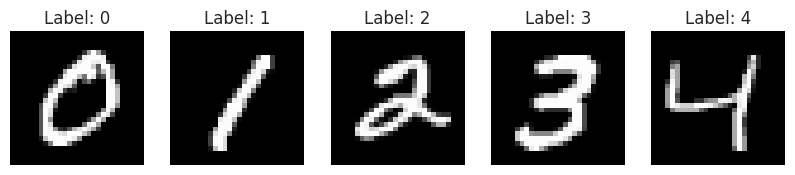

In [16]:
# Initialize a dictionary to store the first instance of each number 0-4
first_instance = {}

# Loop through the dataset to find the first instance for numbers 0-4
for i in range(len(mnist_label)):

    label = mnist_label[i]

    if label not in first_instance:
        first_instance[label] = i

# Plotting
fig, axes = plt.subplots(1, 5, figsize=(10, 2))

for label, index in first_instance.items():
    ax = axes[int(label)]
    ax.imshow(mnist_data.loc[index].values.reshape(28, 28), cmap='gray')
    ax.set_title(f'Label: {label}')
    ax.axis('off')

plt.show()

In [17]:
N_NEIGHBORS = 20
index = NNDescent(mnist_data, n_neighbors=N_NEIGHBORS)
neighbors, distances = index.query(mnist_data, k=N_NEIGHBORS)

In [18]:
neighbors.shape

(35735, 20)

In [19]:
distances.shape

(35735, 20)

In [20]:
print(neighbors[:20,:5])

[[    0   333 26094 34500 30190]
 [    1 32887 27648 23528  2246]
 [    2    14  4468 18125 26177]
 [    3 23605 34195  5127 12406]
 [    4 34986 15088 10683  4925]
 [    5  6396 30100  2608 27532]
 [    6 26247 30826 26369 35421]
 [    7  2951  7085 35218 28009]
 [    8 21158 29828  1702 29818]
 [    9 10228 31283 32738 13478]
 [   10  9042 20964 20983 32500]
 [   11  1461 12827 28343  4706]
 [   12 11149  4707 26846  2450]
 [   13 19035 33819    68   333]
 [   14 28012 29724     2  7819]
 [   15 11266 21074 18932 14531]
 [   16 10298 30330 29308 33448]
 [   17 15922 22927  3841  8099]
 [   18 14299 21499 24794 19452]
 [   19 10277 12283 27306 20523]]


In [21]:
print(distances[:20,:5])

[[0.        4.0025387 4.3158016 4.3695583 4.413664 ]
 [0.        5.3273163 5.402473  6.0436363 6.093434 ]
 [0.        1.645424  1.6983155 1.7571472 1.7846886]
 [0.        5.7030854 5.7560773 5.8200917 5.8497186]
 [0.        2.0190747 2.169698  2.2051282 2.218336 ]
 [0.        4.404384  4.491249  4.575397  4.7650447]
 [0.        1.6835318 1.7950891 1.7965837 1.8011829]
 [0.        3.0204685 3.9795382 4.3531566 4.4182453]
 [0.        4.191122  4.6941586 4.716273  4.7353053]
 [0.        4.841057  5.006231  5.0831156 5.104592 ]
 [0.        1.193633  1.3076652 1.5288687 1.6061063]
 [0.        5.536782  5.856629  5.882511  5.9822845]
 [0.        4.8734417 5.5431523 5.77564   5.804689 ]
 [0.        4.478986  4.9372363 5.116263  5.144714 ]
 [0.        1.5201428 1.538135  1.645424  1.664215 ]
 [0.        5.50225   5.6558933 5.839876  5.8611617]
 [0.        4.7328944 5.3089194 5.4965177 5.8032618]
 [0.        2.9286034 3.9086022 3.961219  4.0143704]
 [0.        4.7694273 5.038561  5.521318  5.54

In [22]:
neighbors = neighbors[:, 1:]
distances = distances[:, 1:]

Text(0.5, 1.0, 'Neighbor distance from "data point 0"')

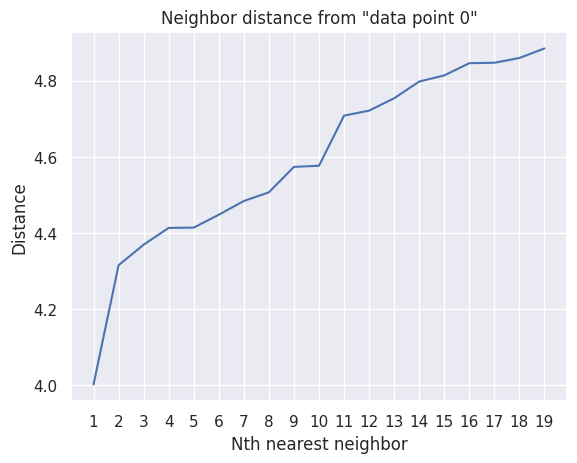

In [23]:
plt.figure()
plt.plot(np.arange(distances.shape[1], dtype=np.int32)+1, distances[0,:])
plt.xlabel('Nth nearest neighbor')
plt.xticks(np.arange(distances.shape[1], dtype=np.int32)+1)
plt.ylabel('Distance')
plt.title('Neighbor distance from "data point 0"')

In [24]:
rhos = distances[:, 0]
print(rhos[:5])

[4.0025387 5.3273163 1.645424  5.7030854 2.0190747]


##Calculate Sigmas

In [25]:
# Set parameter values for binary search
BINARY_ITER = 64
GAMMA_TOLERANCE = 1e-5

# Log target is same everywhere
log_target = np.log2(N_NEIGHBORS)

In [26]:
# Example - binary search for a single row
curr_dist = distances[0,:]

# Initialize array of zeros
zero_array = np.zeros(curr_dist.shape[0])

# Set up binary search for sigma
sigma_high = np.inf
sigma_low = 0
sigma_mid = 1

# Perform N itterations
for iter_i in range(BINARY_ITER):

    # Substract distances and rho
    dist_diff = curr_dist - rhos[0]

    # Divide by sigma, negate, perform exponent, sum
    sigma_sum = np.sum(np.exp(-dist_diff/sigma_mid))

    # Break the loop if sum is equal to the target
    if np.abs(sigma_sum-log_target) < GAMMA_TOLERANCE:
        break

    # If obtained sum is greater than the target then
    # make sigma smaller
    if sigma_sum > log_target:

        sigma_high = sigma_mid
        sigma_mid = (sigma_high + sigma_low)/2

    # If obtained sum is lower than the target then
    # make sigma higher
    else:
        sigma_low = sigma_mid
        if sigma_high == np.inf:
            sigma_mid = sigma_mid*2
        else:
            sigma_mid = (sigma_high + sigma_low)/2

print('Obtained sigma sum is : {}'.format(sigma_sum))
print('Target sigma sum is : {}'.format(log_target))
print('Value of sigma is : {}'.format(sigma_mid))

Obtained sigma sum is : 4.321928024291992
Target sigma sum is : 4.321928094887363
Value of sigma is : 0.34084129333496094


Text(0.5, 1.0, 'Neighbor similarity to "data point 0"')

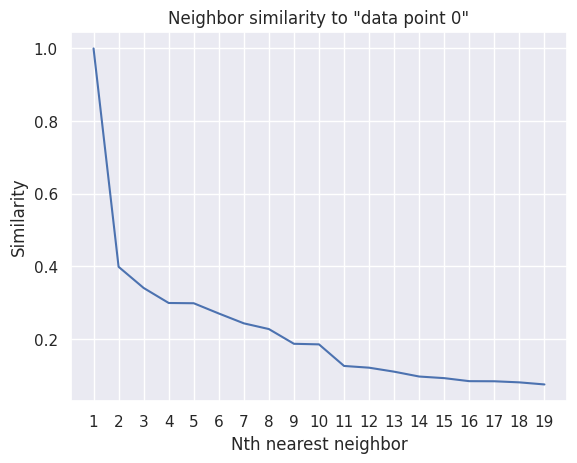

In [27]:
sims_1 = np.exp(-((curr_dist - rhos[0]) / (sigma_mid)))

plt.figure()
plt.plot(np.arange(distances.shape[1], dtype=np.int32)+1, sims_1)
plt.xlabel('Nth nearest neighbor')
plt.xticks(np.arange(distances.shape[1], dtype=np.int32)+1)
plt.ylabel('Similarity')
plt.title('Neighbor similarity to "data point 0"')


In [28]:
# Wrap binary search into function
def binary_search_for_sigma(curr_dist, curr_rho, log_target, binary_iter, smooth_k_tolerance):

    # Set up binary search for sigma
    sigma_high = np.inf
    sigma_low = 0
    sigma_mid = 1

    # Perform N itterations
    for _ in range(binary_iter):

        # Substract distances and rho
        dist_diff = curr_dist - curr_rho

        # Divide by sigma, negate, perform exponent, sum
        sigma_sum = np.sum(np.exp(-dist_diff/sigma_mid))

        # Break the loop if sum is equal to the target
        if np.abs(sigma_sum-log_target) < smooth_k_tolerance:
            return sigma_mid

        # If obtained sum is greater than the target then
        # make sigma smaller
        if sigma_sum > log_target:

            sigma_high = sigma_mid
            sigma_mid = (sigma_high + sigma_low)/2

        # If obtained sum is lower than the target then
        # make sigma higher
        else:
            sigma_low = sigma_mid
            if sigma_high == np.inf:
                sigma_mid = sigma_mid*2
            else:
                sigma_mid = (sigma_high + sigma_low)/2

    return sigma_mid

In [29]:
# Calculate sigma value for each sample
sigma_values = np.zeros(distances.shape[0])

for sample_i in range(distances.shape[0]):

    sigma_values[sample_i] = binary_search_for_sigma(
        curr_dist=distances[sample_i,:],
        curr_rho=rhos[sample_i],
        log_target=log_target,
        binary_iter=BINARY_ITER,
        smooth_k_tolerance=GAMMA_TOLERANCE
    )

##Calculate simalirites

In [30]:
# Get number of samples and choosen number of neighbours
n_samples = neighbors.shape[0]
n_neighbors = neighbors.shape[1]

# Initialize row, col and val arrays, this will later
# be used to construct sparse matrix in order to symetrize
# smoothed distance matrix.
row_idx = np.zeros(neighbors.size, dtype=np.int32) # will be used to store index of the
col_idx = np.zeros(neighbors.size, dtype=np.int32) # will be used to store index of the neighbours
mtx_vals = np.zeros(neighbors.size, dtype=np.float32) # will be used to store similarity between sample and neighboor

# Loop goint through samples
for i in range(n_samples):
    # Inner loop going through the neighbours
    for j in range(n_neighbors):

        # Calculate similarities in high dimensional space
        val = np.exp(-((distances[i, j] - rhos[i]) / (sigma_values[i])))

        # store sample indexes e.g. [1,1,1,1,2,2,2,2]
        row_idx[i * n_neighbors + j] = i
        # store neighbour indexes e.g. [2,3,4,5,2,3,4,5]
        col_idx[i * n_neighbors + j] = neighbors[i, j]
        # store similarities e.g [0.1, 0.3, 0.2, 0.5, 0.8,0.12, 0.19, 0.97]
        mtx_vals[i * n_neighbors + j] = val



In [31]:
# Create sparse matrix of smoothed distances
# Distances in this matrix are not yet symetric
non_sym_sim_mtx = scipy.sparse.coo_matrix(
    (mtx_vals, (row_idx, col_idx)), shape=(neighbors.shape[0], neighbors.shape[0])
)
non_sym_sim_mtx.eliminate_zeros()

In [32]:
non_sym_sim_mtx.shape

(35735, 35735)

In [33]:
# Transpose smooth distance matrix
non_sym_sim_mtx_t = non_sym_sim_mtx.transpose()

# Multiply smooth distance matrix with its transponse element-wise
prod_matrix = non_sym_sim_mtx.multiply(non_sym_sim_mtx_t)

# Create symetrical smooth distance matrix by using fuzzy set union operation
sim_mtx = non_sym_sim_mtx + non_sym_sim_mtx_t - prod_matrix

# Eliminate all zeroes from the result
sim_mtx.eliminate_zeros()

In [34]:
# Transform sparse matrix to coordinate format
sim_mtx = sim_mtx.tocoo()

In [35]:
# Return to the old format
sim_mtx_row_ids = sim_mtx.row
sim_mtx_col_ids = sim_mtx.col
sim_mtx_vals = sim_mtx.data

In [36]:
# Show how indexes and coordinates look like
# Also show identity of each index (for both samples and neighbours)
test = pd.DataFrame(
    np.column_stack([sim_mtx_row_ids, sim_mtx_col_ids, sim_mtx_vals]),
    columns = ['row', 'col', 'similarities']
)

ri_labels = mnist_label.reset_index(drop=True)
row_labels = ri_labels[sim_mtx_row_ids]
col_labels = ri_labels[sim_mtx_col_ids]

test.head()

,row,col,similarities
0,0.0,13.0,0.164273
1,0.0,333.0,1.000000
2,0.0,814.0,0.227533
3,0.0,1320.0,0.270415
4,0.0,2120.0,0.110248


##Embedding the graph in 2-d space

In [37]:
# Set up hyper parameters
MIN_DIST = 0.1
N_COMPONENTS = 2
N_EPOCHS = 2000
N_NEGATIVE = 8
LEARNING_RATE = 4

In [38]:
def optim_curve(x, a, b):
    return 1.0 / (1.0 + a * x ** (2 * b))

# 300 simulated points between 0 and 3
# this axis simulates distances between
# points in low dimensional space
sim_dist = np.linspace(0, 3, 300)
# placehodler for target valyes
target_vals = np.zeros(sim_dist.shape)
# set distances smaller than min_dist to 1
target_vals[sim_dist < MIN_DIST] = 1.0
# set distances greater than min_dist
target_vals[sim_dist >= MIN_DIST] = np.exp(-(sim_dist[sim_dist >= MIN_DIST] - MIN_DIST)
)
# optimize a and b parameters of function defined by "optim_curve"
# in order to produce target_vals when sim_dist is inputed
params, _ = curve_fit(optim_curve, sim_dist, target_vals)

a,b = params[0], params[1]

In [39]:
print('Value of a is {}'.format(a))
print('Value of b is {}'.format(b))

Value of a is 1.5769434601962196
Value of b is 0.8950608779914887


Text(0.5, 1.0, 'Target similarity')

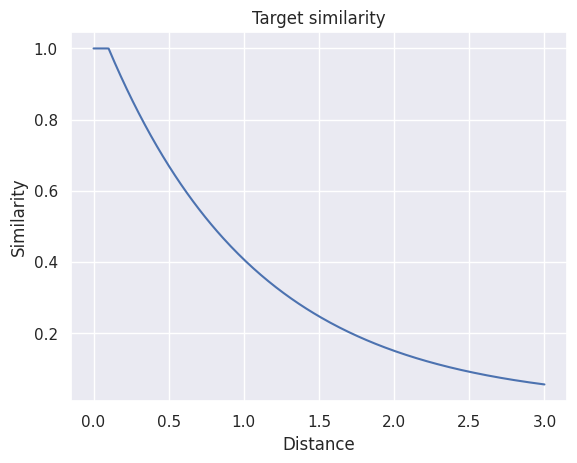

In [40]:
plt.plot(sim_dist, target_vals)
plt.xlabel('Distance')
plt.ylabel('Similarity')
plt.title('Target similarity')

Text(0.5, 1.0, 'Fitted curve')

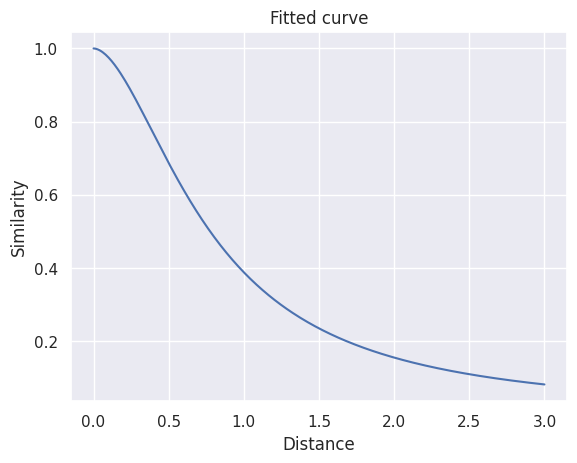

In [41]:
sim_dist = np.linspace(0, 3, 300)
similarities = optim_curve(sim_dist, a, b)
plt.plot(sim_dist, similarities)
plt.xlabel('Distance')
plt.ylabel('Similarity')
plt.title('Fitted curve')

##Low dimensional embedding

In [42]:
# Initialize embedding with random values
embedding = np.random.uniform(
    low=-3.0, high=3.0, size=(sim_mtx.shape[0], N_COMPONENTS)
)

In [43]:
def euclidean_optim_one_epoch(sim_mtx_row_ids, sim_mtx_col_ids, a, b, embedding, weights, learning_rate, n_negative):

    # Iterate through pairs of samples and neighboirs
    # i represents sample index
    # j represents neighbour index
    for i,j in zip(sim_mtx_row_ids, sim_mtx_col_ids):

        # Get embeddings for sample and index
        p1 = embedding[i, :]
        p2 = embedding[j, :]

        # Find euclidean distance in low dimensional space
        dist_squared = np.sum(np.square(p1-p2))

        # Do full gradient calculation for neighbours if distance is greater than zero
        if dist_squared > 0:
            curr_grad = (
                weights[i]*2*a*b*dist_squared**(b-1) / (a*dist_squared**b + 1.)
                - (1-weights[i])*(2*b / ((0.001 + dist_squared)*(1+a*dist_squared**b)))
            )
        else:
            curr_grad = 0.

        curr_grad = curr_grad*(p1-p2)

        # Clip the gradients
        curr_grad = np.clip(curr_grad, -4., 4.)

        # Apply gradient to both, sample an neighbour
        embedding[i, :] -= curr_grad*learning_rate
        embedding[j, :] += curr_grad*learning_rate

        # Sample N random points and use them as "negative sample"
        # Negative sample is the sample that is not connected to the current sample
        for _ in range(n_negative):

            # Get randomly sample index
            neg_j = np.random.randint(embedding.shape[0])

            # Get embedding of negative sample
            p_neg = embedding[neg_j, : ]

            # Find euclidean distance between current sample and
            # negative sample
            dist_squared = np.sum(np.square(p1-p_neg))

            # Calculate gradient (formula is shorter because we assume weights[i]==0)
            # for thus case
            if dist_squared > 0.:
                curr_grad = -2.*b / ((0.001 + dist_squared)*(1+a*dist_squared**b))
            else:
                curr_grad = 0.

            curr_grad = curr_grad*(p1-p_neg)

            # Clip the gradient
            curr_grad = np.clip(curr_grad, -4., 4.)

            # Apply gradient to the both, sample and the neighbour
            embedding[i, :] -=  curr_grad*learning_rate
            embedding[neg_j, :] +=  curr_grad*learning_rate


# Optimize the function by using numba
optimize_fn = numba.njit(
    euclidean_optim_one_epoch, fastmath=True, parallel=False
)

In [44]:
euclidean_optim_one_epoch(
    sim_mtx_row_ids=sim_mtx_row_ids,
    sim_mtx_col_ids=sim_mtx_col_ids,
    a=a,
    b=b,
    embedding=embedding,
    weights=sim_mtx_vals,
    learning_rate=LEARNING_RATE,
    n_negative=N_NEGATIVE
)

In [45]:
optimize_fn(
    sim_mtx_row_ids=sim_mtx_row_ids,
    sim_mtx_col_ids=sim_mtx_col_ids,
    a=a,
    b=b,
    embedding=embedding,
    weights=sim_mtx_vals,
    learning_rate=LEARNING_RATE,
    n_negative=N_NEGATIVE
)

0


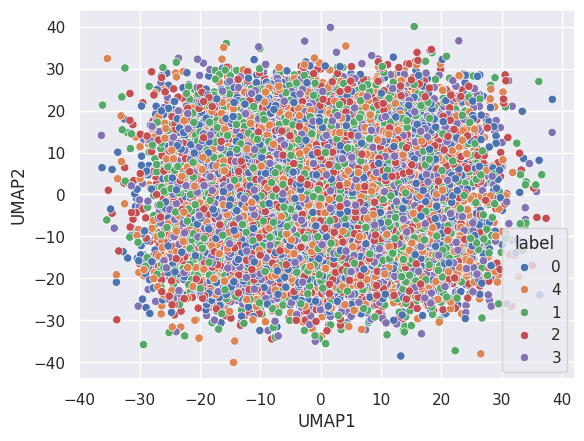

20


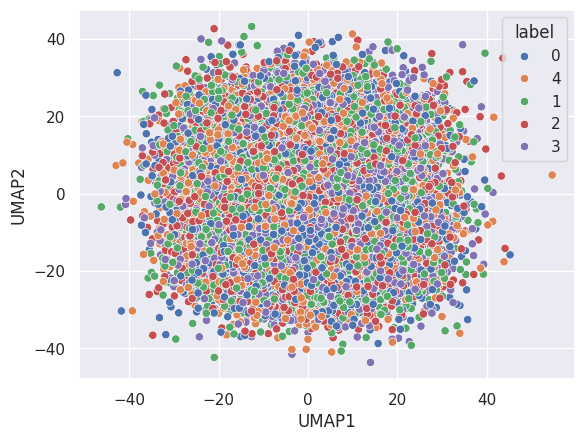

40


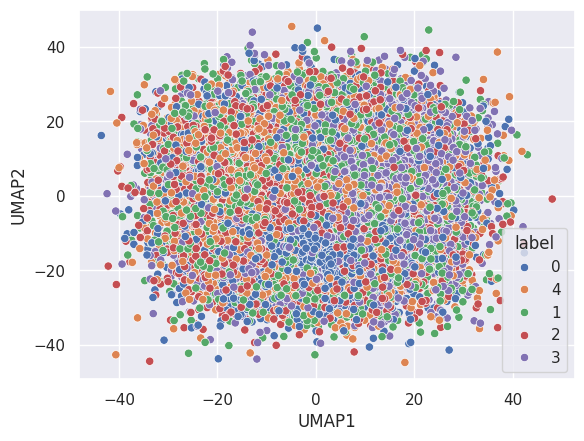

60


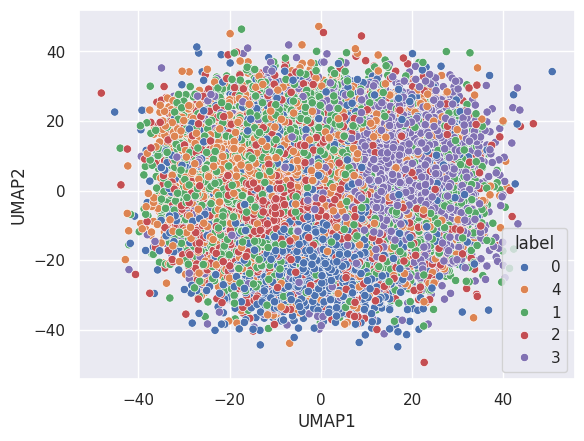

80


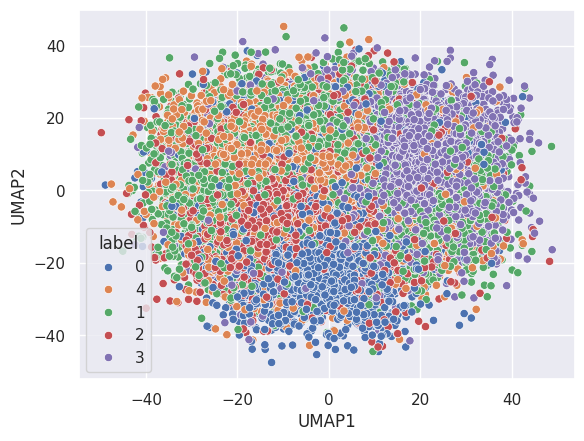

100


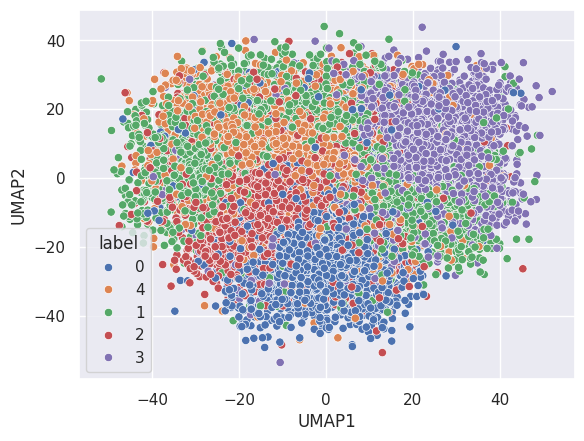

120


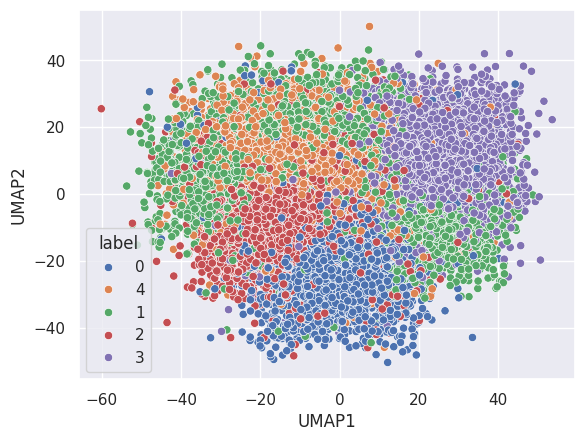

140


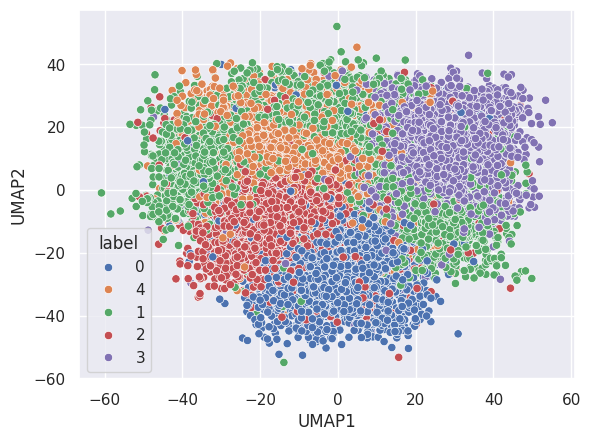

160


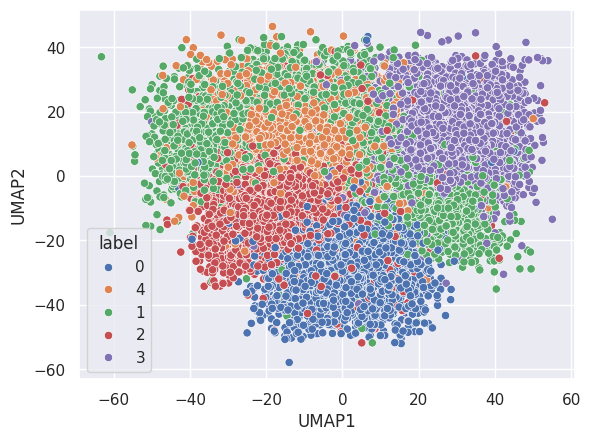

KeyboardInterrupt: 

In [46]:
# Optimize in a loop
for epoch_i in range(200):
    optimize_fn(
        sim_mtx_row_ids=sim_mtx_row_ids,
        sim_mtx_col_ids=sim_mtx_col_ids,
        a=a,
        b=b,
        embedding=embedding,
        weights=sim_mtx_vals,
        learning_rate=LEARNING_RATE,
        n_negative=N_NEGATIVE
    )

    if epoch_i%20 == 0:
        print(epoch_i)
        test_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'])
        test_df['label'] = mnist_label.values
        sns.scatterplot(test_df,x='UMAP1', y='UMAP2', hue='label')
        plt.show()

In [47]:
def euclidean_optim_one_epoch(sim_mtx_row_ids, sim_mtx_col_ids, a, b, embedding, weights, learning_rate, n_negative):

    # In order to uze numpa parallel, loop must be performed with numba.prange
    for iter_i in numba.prange(sim_mtx_row_ids.shape[0]):

        # Extract index for sample and neighbour
        i = sim_mtx_row_ids[iter_i]
        j = sim_mtx_col_ids[iter_i]

        # Get embeddings for sample and neighbour
        p1 = embedding[i, :]
        p2 = embedding[j, :]

        # Find euclidean distance in low dimensional space
        dist_squared = np.sum(np.square(p1-p2))

        # Do full gradient calculation for neighbours if distance is greater than zero
        if dist_squared > 0:
            curr_grad = (
                weights[i]*2*a*b*dist_squared**(b-1) / (a*dist_squared**b + 1.)
                - (1-weights[i])*(2*b / ((0.001 + dist_squared)*(1+a*dist_squared**b)))
            )
        else:
            curr_grad = 0.

        curr_grad = curr_grad*(p1-p2)

        # Clip the gradients
        curr_grad = np.clip(curr_grad, -4., 4.)

        # Apply gradient to both, sample an neighbour
        embedding[i, :] -= curr_grad*learning_rate
        embedding[j, :] += curr_grad*learning_rate

        # Sample N random points and use them as "negative sample"
        # Negative sample is the sample that is not connected to the current sample
        for _ in range(n_negative):

            # Get randomly sample index
            neg_j = np.random.randint(embedding.shape[0])

            # Get embedding of negative sample
            p_neg = embedding[neg_j, : ]

            # Find euclidean distance between current sample and
            # negative sample
            dist_squared = np.sum(np.square(p1-p_neg))

            # Calculate gradient (formula is shorter because we assume weights[i]==0)
            # for thus case
            if dist_squared > 0.:
                curr_grad = -2.*b / ((0.001 + dist_squared)*(1+a*dist_squared**b))
            else:
                curr_grad = 0.

            curr_grad = curr_grad*(p1-p_neg)

            # Clip the gradient
            curr_grad = np.clip(curr_grad, -4., 4.)

            # Apply gradient to the both, sample and the neighbour
            embedding[i, :] -=  curr_grad*learning_rate
            embedding[neg_j, :] +=  curr_grad*learning_rate

# Optimize the function
optimize_fn = numba.njit(
    euclidean_optim_one_epoch, fastmath=True, parallel=True
)

In [48]:
# Initialize embedding with random values
embedding = np.random.uniform(
    low=-3.0, high=3.0, size=(sim_mtx.shape[0], N_COMPONENTS)
)

0


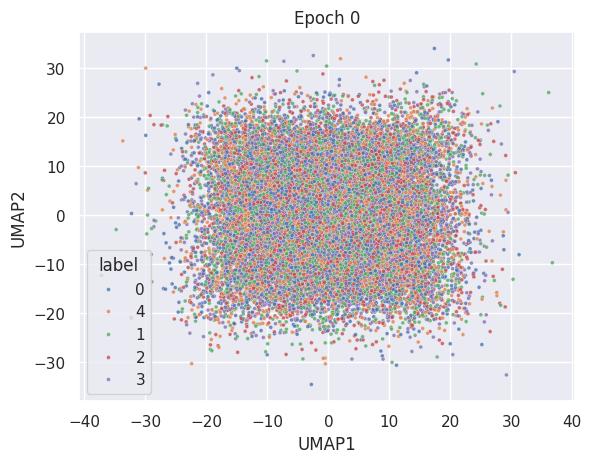

100


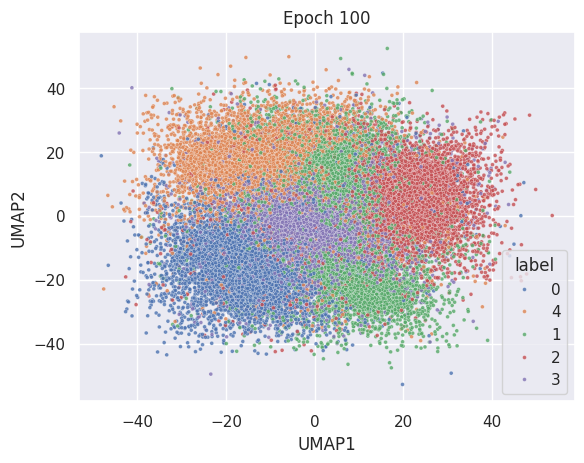

200


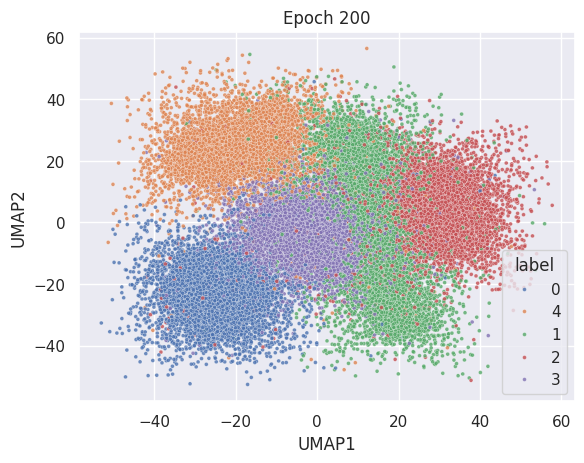

300


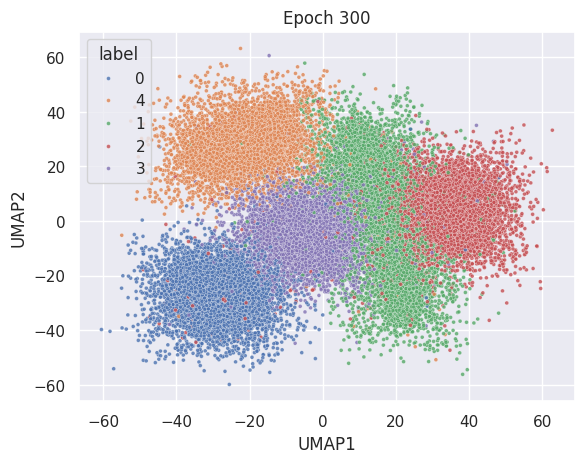

400


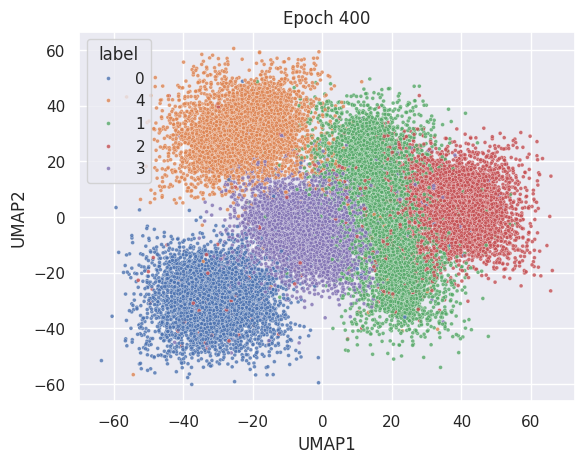

500


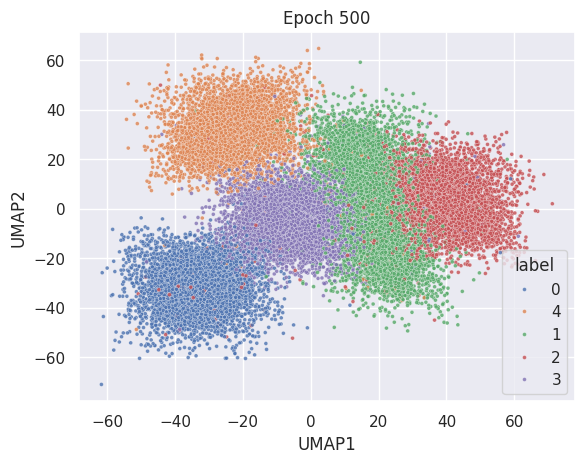

600


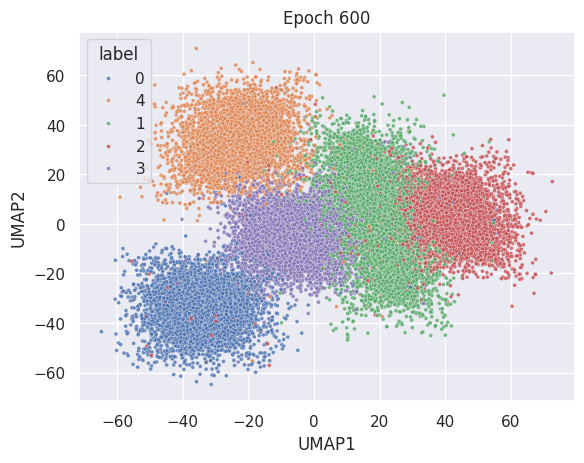

700


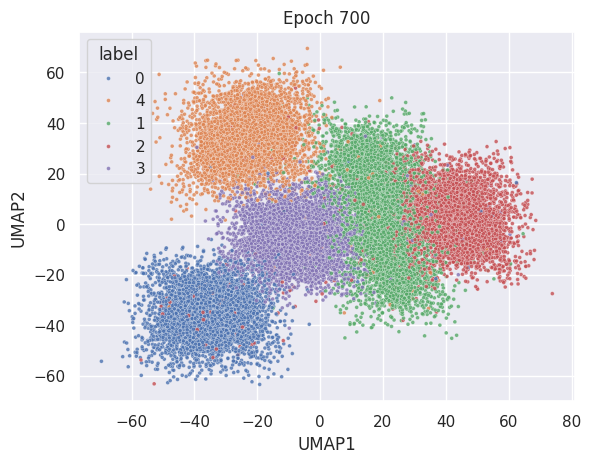

800


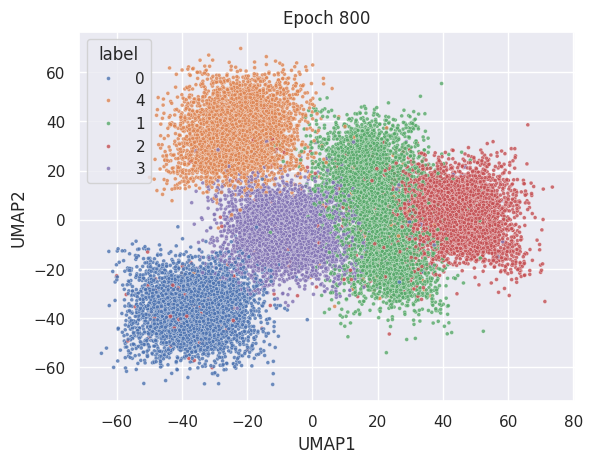

900


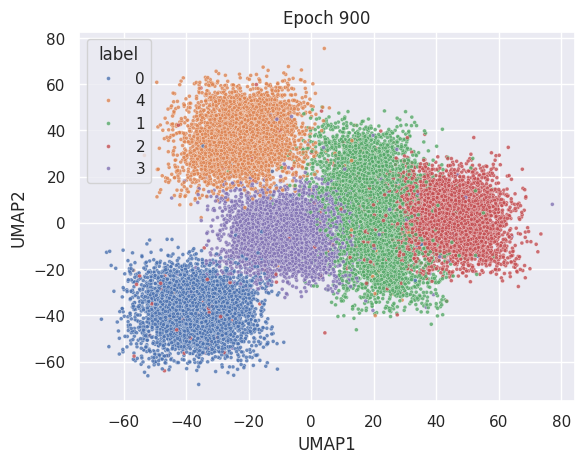

1000


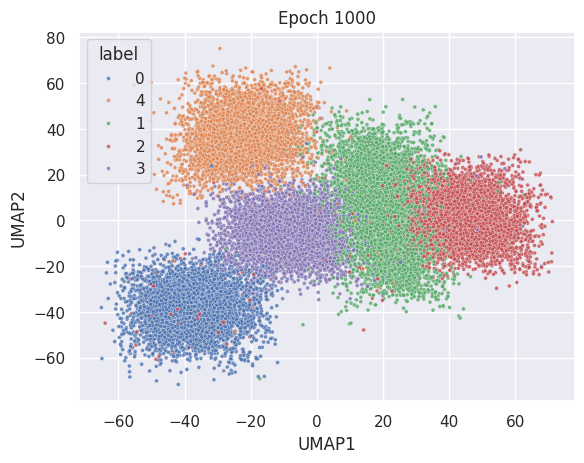

1100


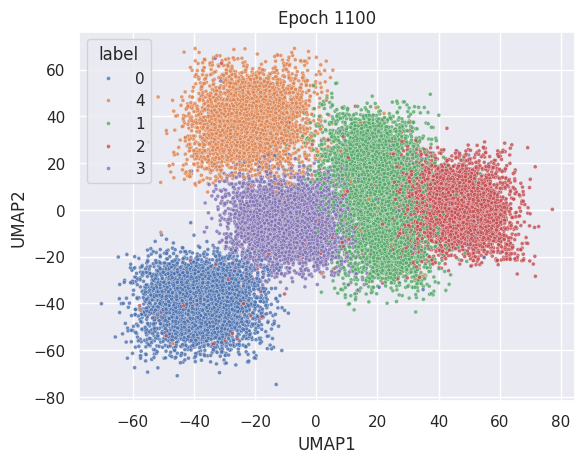

1200


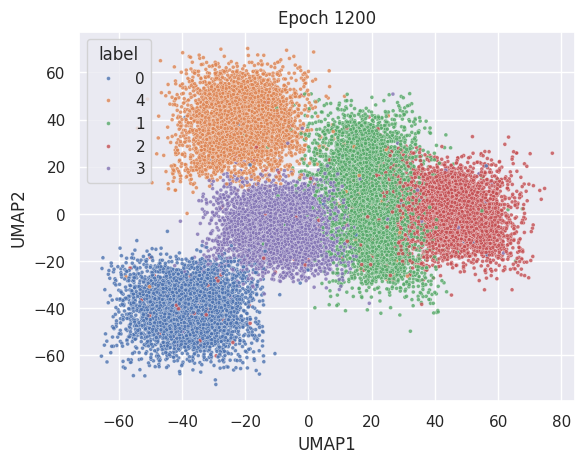

1300


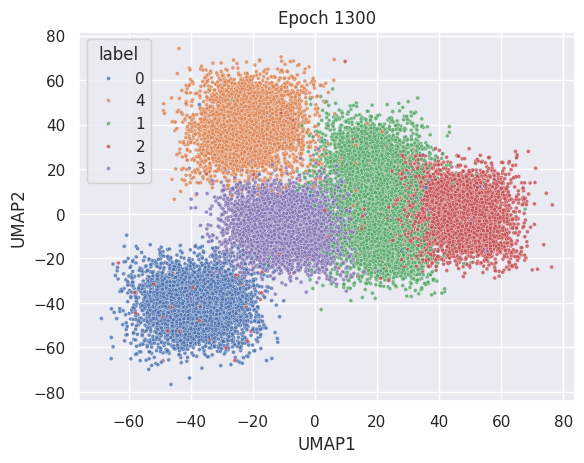

1400


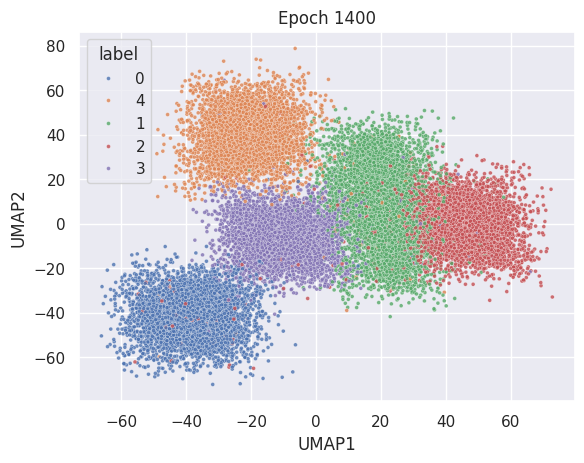

KeyboardInterrupt: 

In [49]:
# Optimize in a loop
for epoch_i in range(N_EPOCHS):
    optimize_fn(
        sim_mtx_row_ids=sim_mtx_row_ids,
        sim_mtx_col_ids=sim_mtx_col_ids,
        a=a,
        b=b,
        embedding=embedding,
        weights=sim_mtx_vals,
        learning_rate=LEARNING_RATE,
        n_negative=N_NEGATIVE
    )

    if epoch_i%100 == 0:
        print(epoch_i)
        test_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'])
        test_df['label'] = mnist_label.values
        sns.scatterplot(test_df,x='UMAP1', y='UMAP2', hue='label', alpha=0.8, s=8)
        plt.title('Epoch ' + str(epoch_i))
        plt.show()

In [50]:
!pip install umap-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 6.7 MB/s eta 0:00:00


In [51]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.datasets import load_iris
from sklearn.datasets import fetch_openml

# figure size in inches
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns

import umap

sns.set_theme()
plt.rcParams['figure.figsize'] = [10, 8]

<Axes: xlabel='UMAP1', ylabel='UMAP2'>

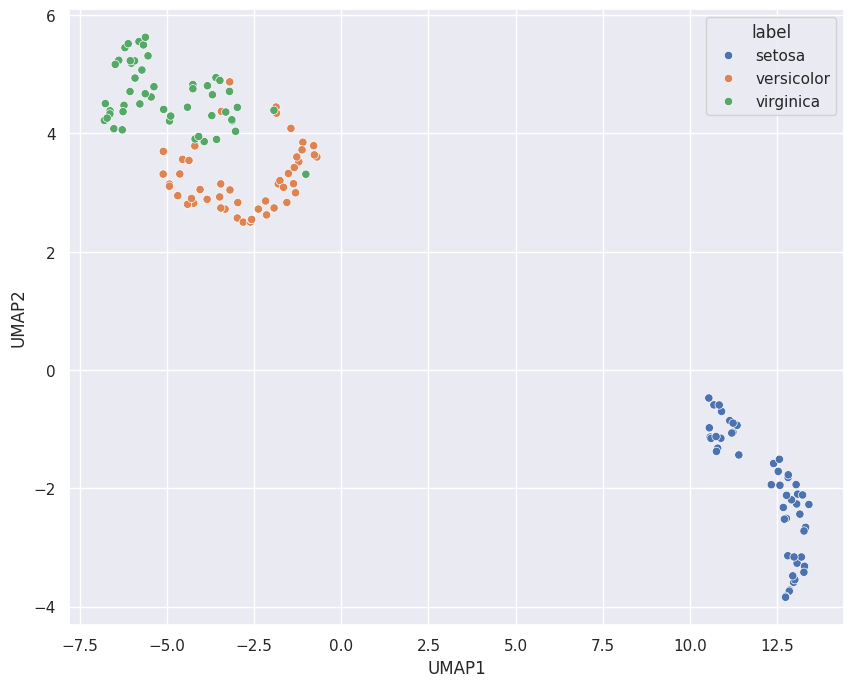

In [52]:
# Load the data
iris = load_iris()

iris_data = iris['data']
iris_label = iris['target_names'][iris['target']]

# Scale iris data
scaled_iris_data = StandardScaler().fit_transform(iris_data)

# Transform the data
umap_obj = umap.UMAP(n_neighbors=20)
umap_obj = umap_obj.fit(scaled_iris_data)
embedding = umap_obj.transform(scaled_iris_data)

# Plot embeded data
embedding_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'])
embedding_df['label'] = iris_label

sns.scatterplot(embedding_df, x='UMAP1', y='UMAP2', hue='label')

In [53]:
umap_obj.embedding_

array([[13.081232  , -2.0971603 ],
       [10.573748  , -1.1332004 ],
       [11.227813  , -1.0524824 ],
       [11.136166  , -0.8546514 ],
       [13.3095255 , -2.6589077 ],
       [12.965312  , -3.5886605 ],
       [12.392451  , -1.5792774 ],
       [12.80725   , -1.81526   ],
       [10.682052  , -0.5888116 ],
       [10.789439  , -1.3210238 ],
       [12.799211  , -3.139178  ],
       [12.525645  , -1.7130313 ],
       [10.550574  , -0.9761451 ],
       [10.900723  , -0.6992647 ],
       [12.851216  , -3.720033  ],
       [12.841219  , -3.7387137 ],
       [13.00078   , -3.5439105 ],
       [13.404201  , -2.2722344 ],
       [12.941545  , -3.4795547 ],
       [13.064661  , -3.264808  ],
       [12.75907   , -2.507137  ],
       [13.189655  , -3.1606843 ],
       [13.145504  , -2.4356399 ],
       [12.574255  , -1.9473795 ],
       [12.558661  , -1.5079677 ],
       [10.599186  , -1.1551129 ],
       [12.813492  , -1.7707896 ],
       [13.054127  , -2.2641068 ],
       [12.905587  ,

In [54]:
umap_obj.graph_

<150x150 sparse matrix of type '<class 'numpy.float32'>'
	with 3594 stored elements in Compressed Sparse Row format>

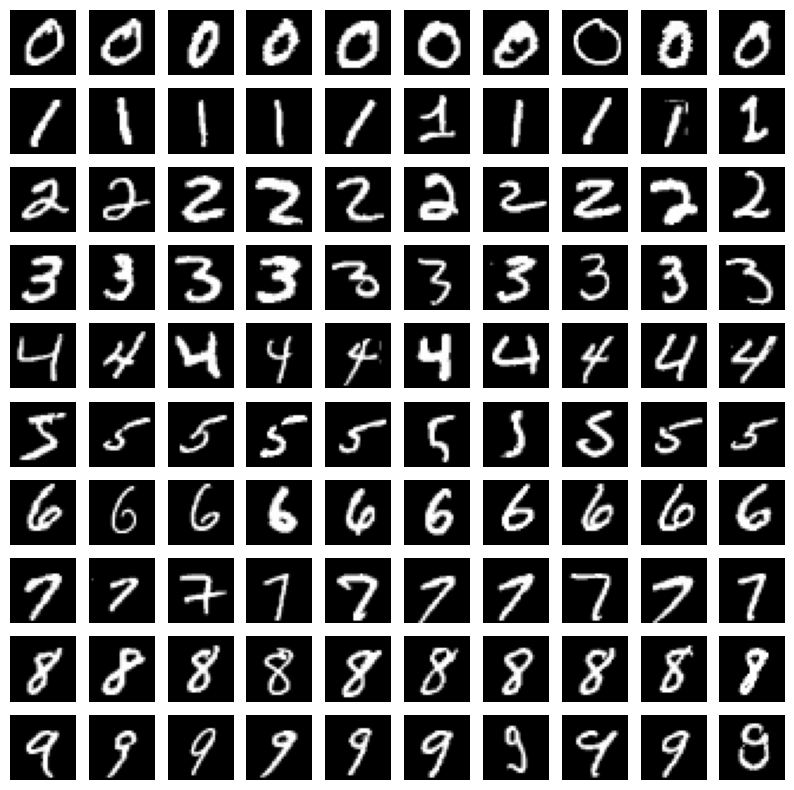

In [55]:
# Load the digits data
mnist = fetch_openml('mnist_784', parser='auto')

# Normalize digits data
mnist_data = mnist.data/255
mnist_label = mnist.target

n_row = 10
n_col = 10
fig, axes = plt.subplots(n_row, n_col, figsize=(10, 10))

mnist_data_np = mnist_data.to_numpy()
mnist_labels_np = mnist_label.to_numpy()

# Loop through subplots to populate them with MNIST digits
for i in range(n_row):
    # Get indices of digits that match the current row number (i.e., '0' for the first row, '1' for the second, etc.)
    indices = np.where(mnist_labels_np == str(i))[0][:n_col]  # Take first 'n_col' indices

    for j in range(n_col):

        ax = axes[i, j]  # Get the subplot

        # Reshape the 784-number array back to a 28x28 image and plot it
        ax.imshow(mnist_data_np[indices[j]].reshape(28, 28), cmap='gray')

        # Hide axis labels and ticks
        ax.axis('off')

# Show the grid of MNIST digits
plt.show()

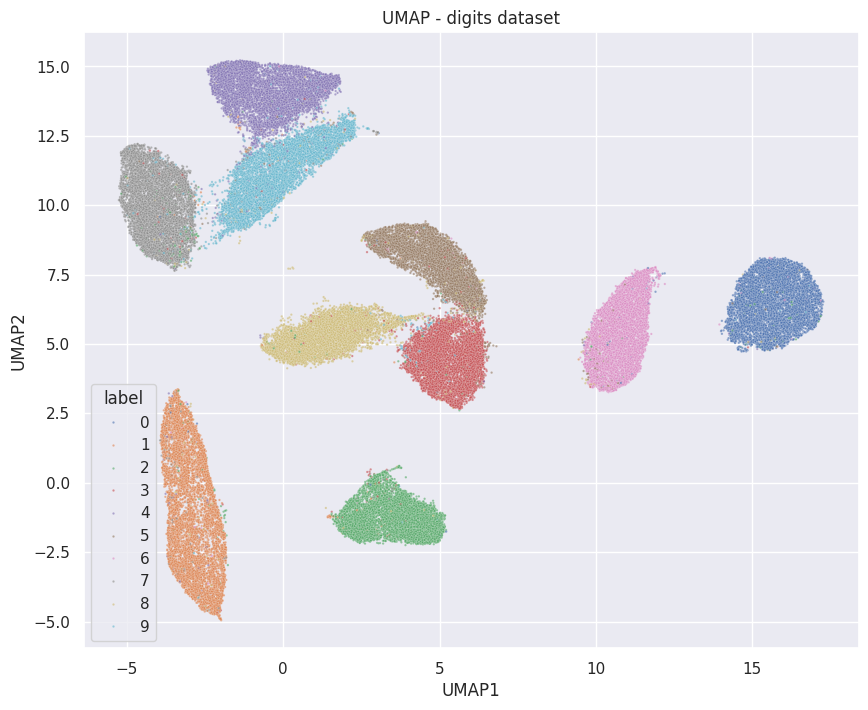

In [56]:
# Perfrom UMAP dimensionality reduction
umap_obj = umap.UMAP()
embedding = umap_obj.fit_transform(mnist_data)

# Plot embeddings
embedding_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'])
embedding_df['label'] = mnist_label

sns.scatterplot(embedding_df, x='UMAP1', y='UMAP2', hue='label', alpha=0.6, s=3)
plt.title('UMAP - digits dataset')
plt.show()

In [59]:
pip install umap-learn[plot]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 78.6 MB/s eta 0:00:00


In [60]:
import umap.plot as uplot

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
/usr/local/lib/python3.10/dist-pa

<Axes: >

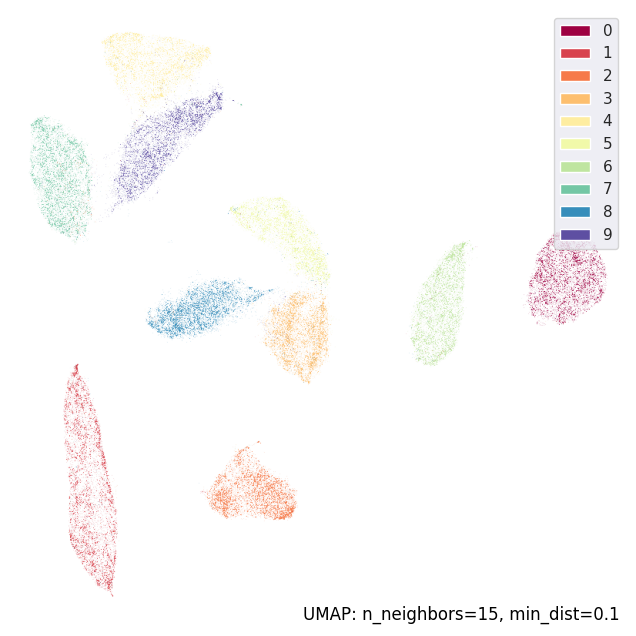

In [61]:
# Plot with visible densities and labels
uplot.points(umap_obj, labels=mnist_label)

<Axes: >

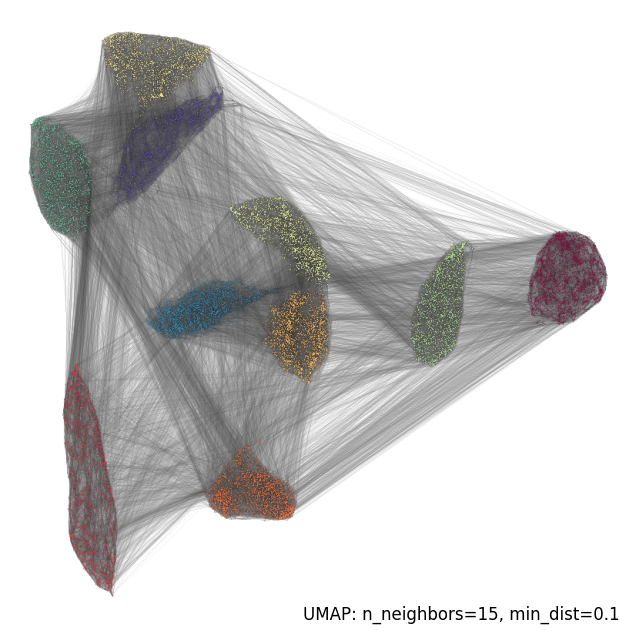

In [62]:
uplot.connectivity(umap_obj, show_points=True, labels=mnist_label)

##Tuning UMAP hyperparameter

In [63]:
import random

import numpy as np
import pandas as pd

import umap
import umap.plot as uplot

import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme()
random.seed(2)

In [64]:
df = pd.read_json('/content/mammoth_3d.json')
df.columns = ['x', 'y', 'z']

In [65]:
df.head()

,x,y,z
0,430.826,106.864,24.492
1,397.734,99.293,14.370
2,480.505,80.876,131.561
3,422.736,87.715,13.504
4,414.840,113.363,78.061


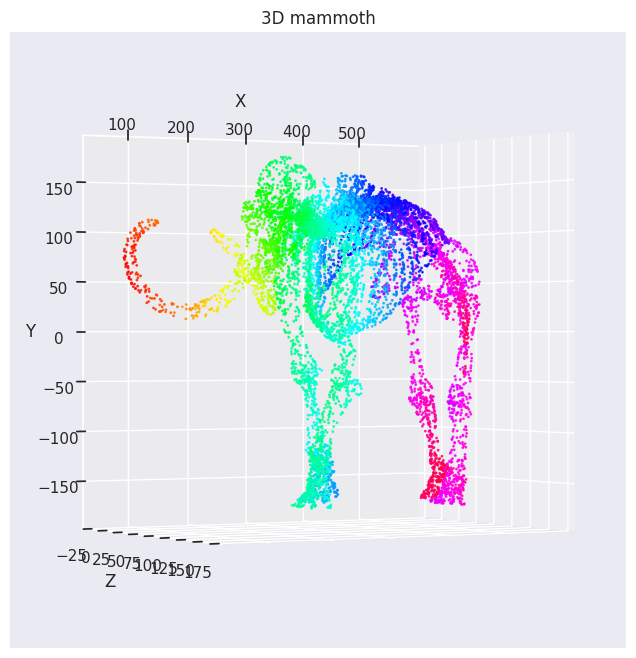

In [66]:
# Create values for colormap
max_value = df[['x', 'y', 'z']].to_numpy().max()
min_value = df[['x', 'y', 'z']].to_numpy().min()
df_normalized = (df - min_value) / (max_value - min_value)

norm = np.sqrt(df['x'].to_numpy()**2 + df['y'].to_numpy()**2 + df['z'].to_numpy()**2)
norm = (norm - np.min(norm)) / (np.max(norm) - np.min(norm))
colormap = plt.cm.hsv


# Plot the data
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df['x'], df['y'], df['z'], s=1, alpha=0.8, c=colormap(norm))


# Labels and title
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D mammoth')

ax.view_init(elev=60, azim=-180, roll=-90)


# Show the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


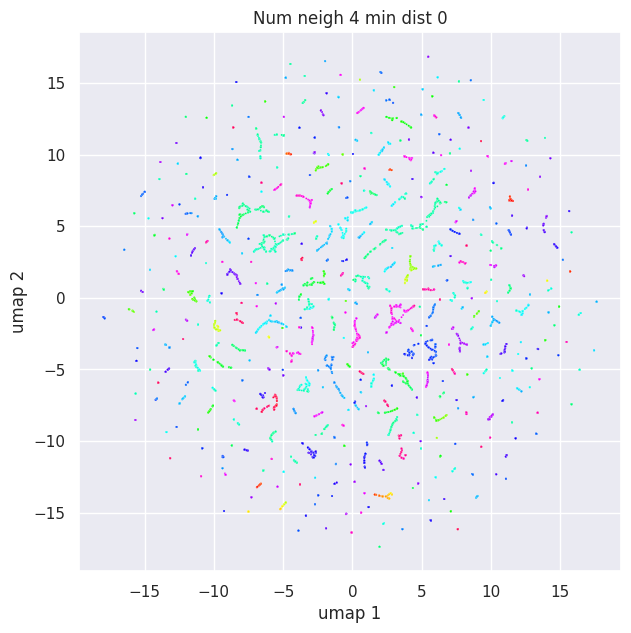

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


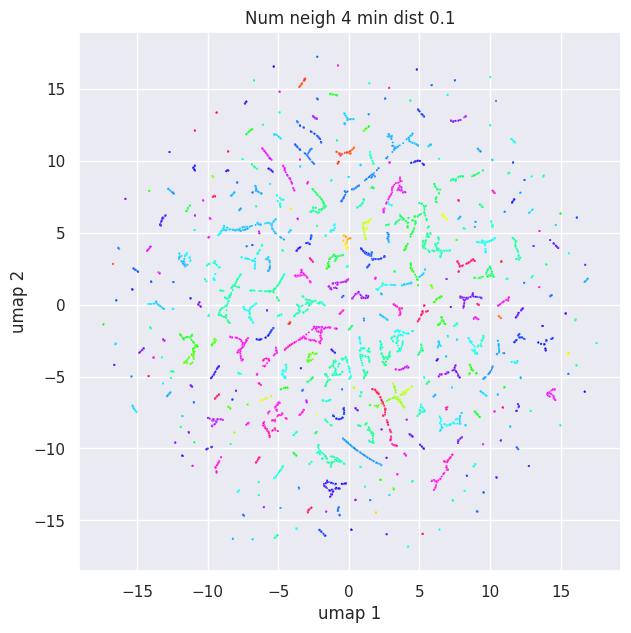

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


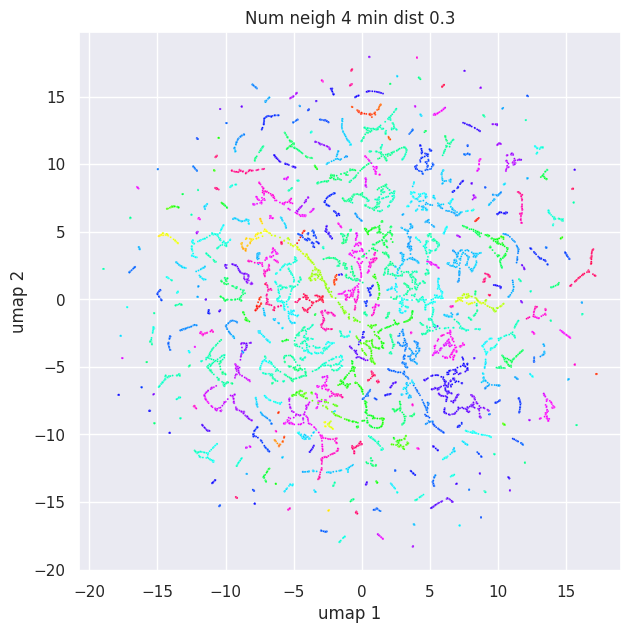

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


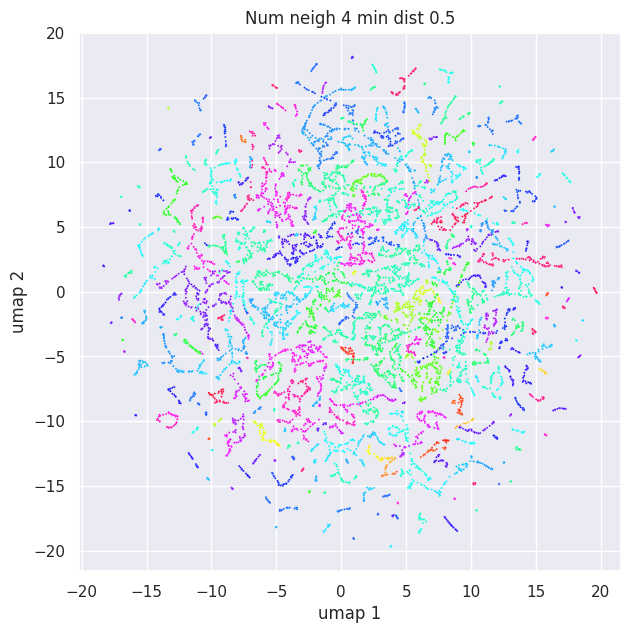

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


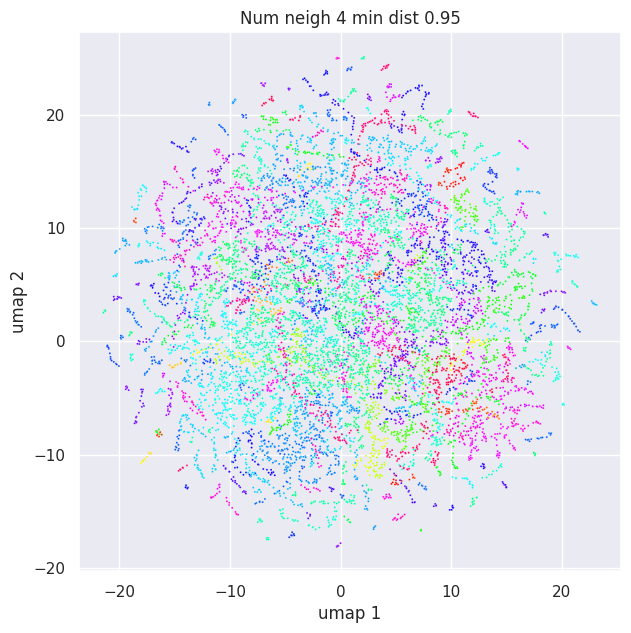

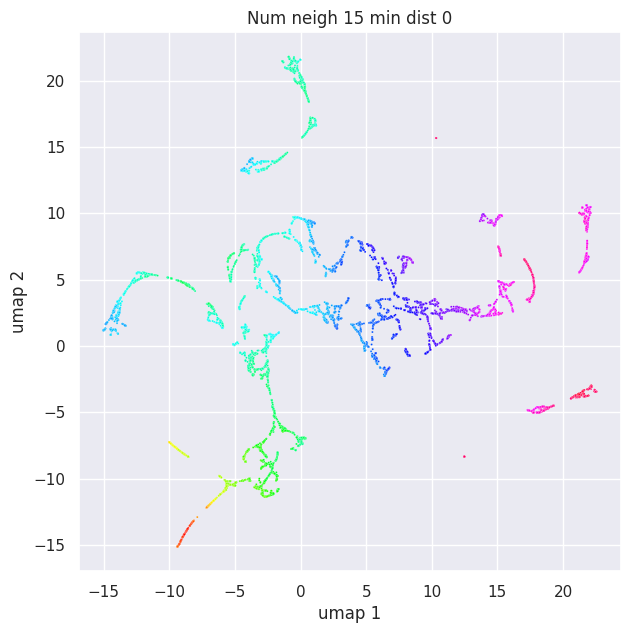

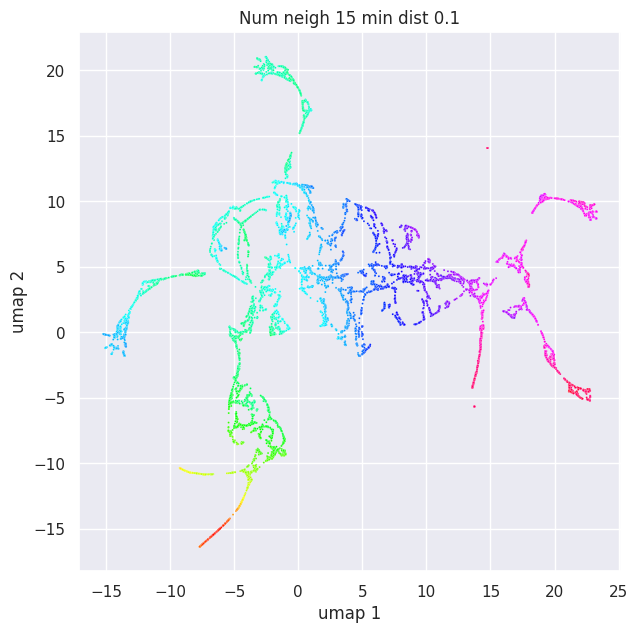

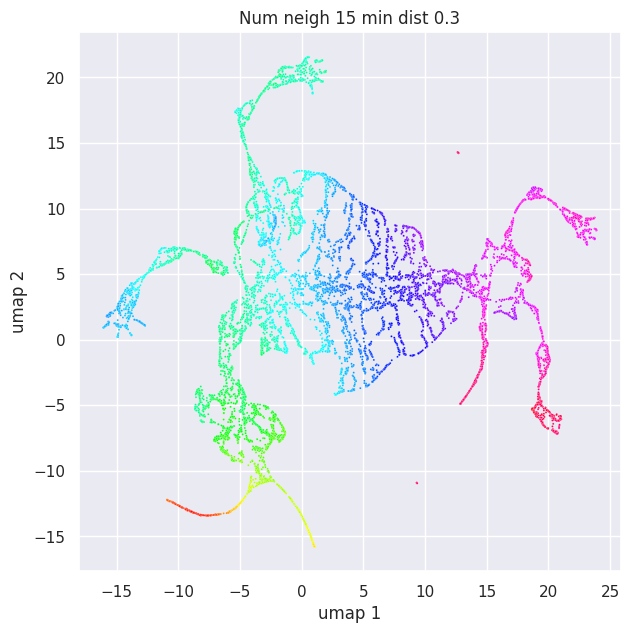

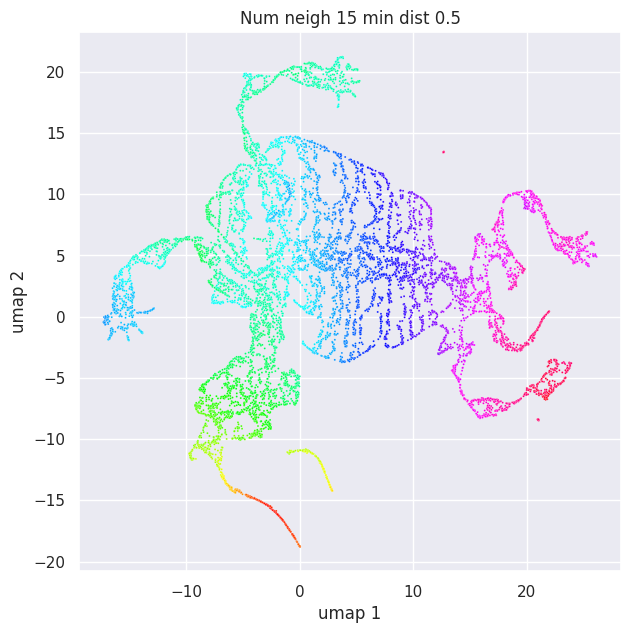

...

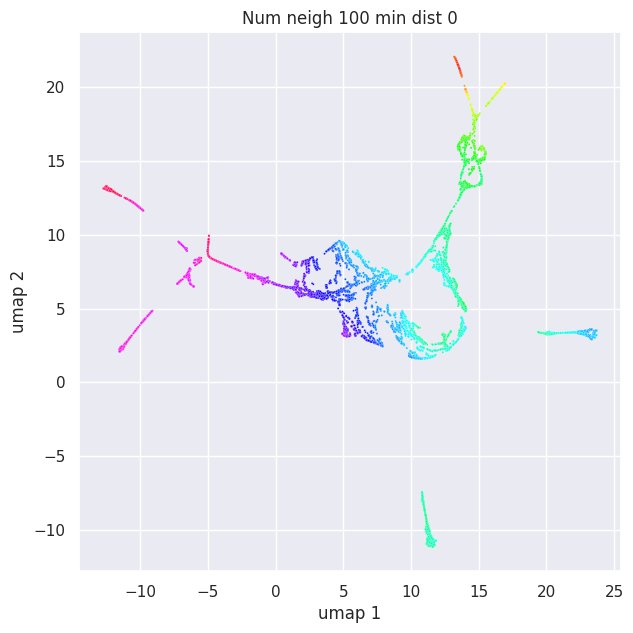

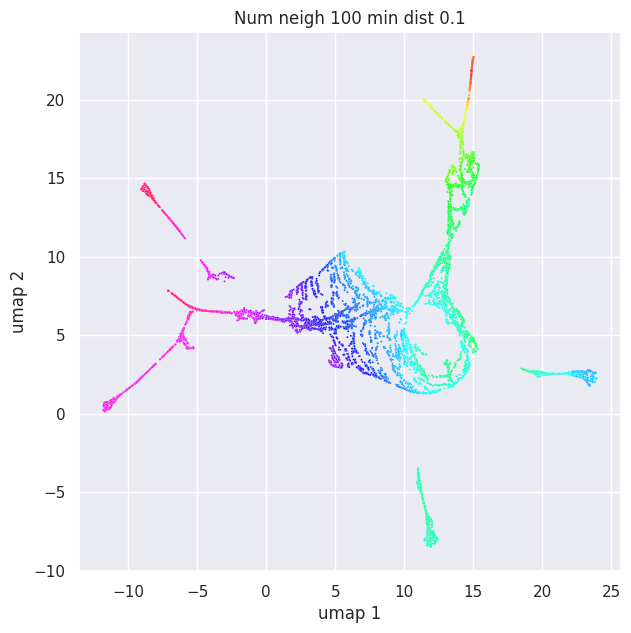

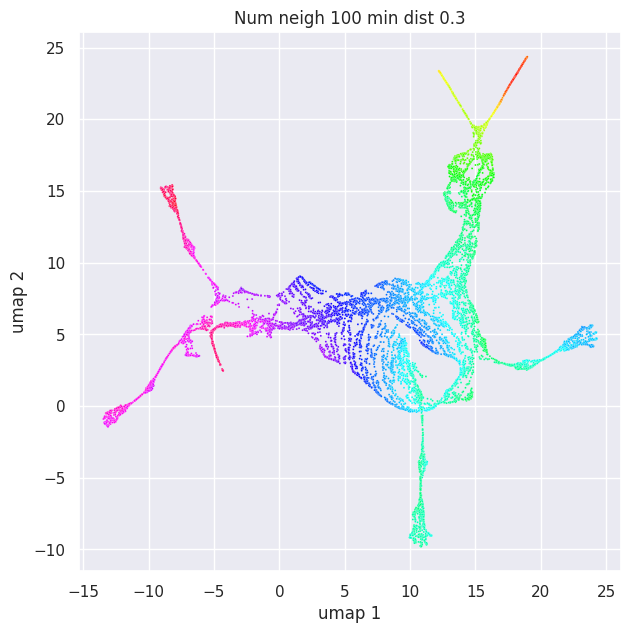

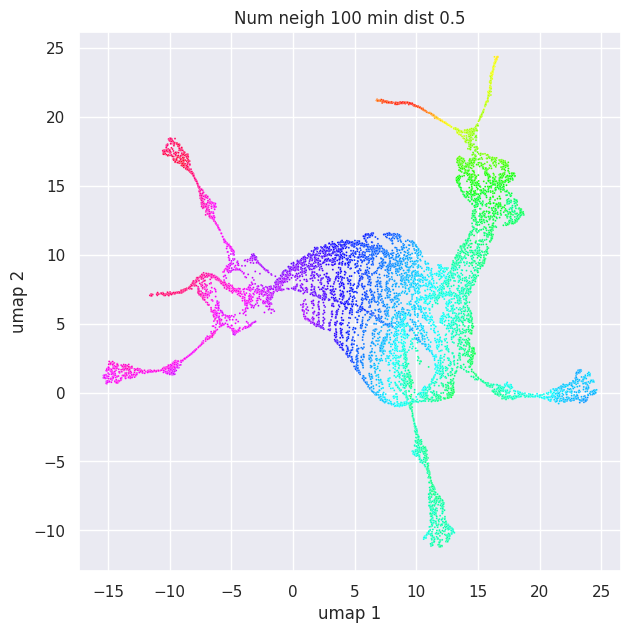

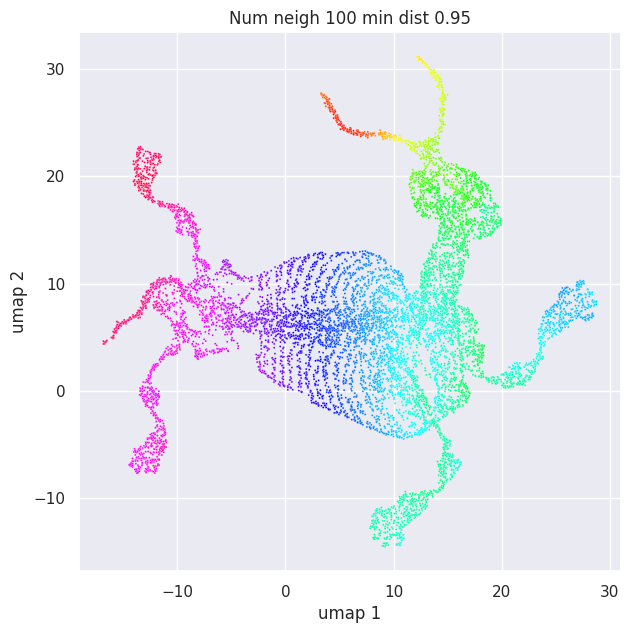

In [67]:
for n_neighbors in [4, 15, 50, 100]:

    for min_dist in [0, 0.1, 0.3, 0.5, 0.95]:

        mnist_umap = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist)
        embedding = mnist_umap.fit_transform(df)

        mm_embedded = pd.DataFrame(embedding, columns=['umap 1', 'umap 2'])

        plt.figure(figsize=(7,7))

        sns.scatterplot(mm_embedded, x='umap 1', y='umap 2', color=colormap(norm), s=2)

        plt.title('Num neigh {} min dist {}'.format(n_neighbors, min_dist))

        plt.show()

##UMAP caveats

In [68]:
import sklearn.datasets
from sklearn.datasets import fetch_openml
import sklearn

import umap
import umap.plot as uplot

import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme()

In [69]:
# Load the digits data
mnist = fetch_openml('mnist_784', parser='auto')

# Normalize the digits data
mnist_data = mnist.data/255
mnist_label = mnist.target

In [70]:
mnist_umap = umap.UMAP()
embedding = mnist_umap.fit_transform(mnist_data)

<Axes: >

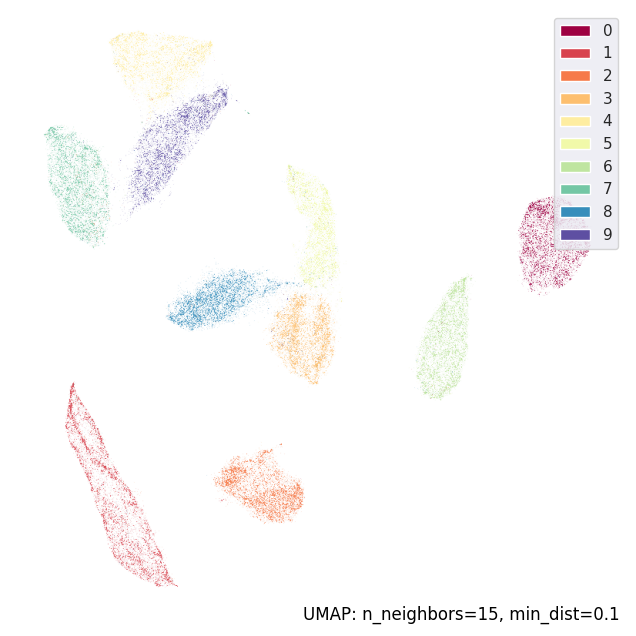

In [71]:
uplot.points(mnist_umap, labels=mnist_label)

<Axes: >

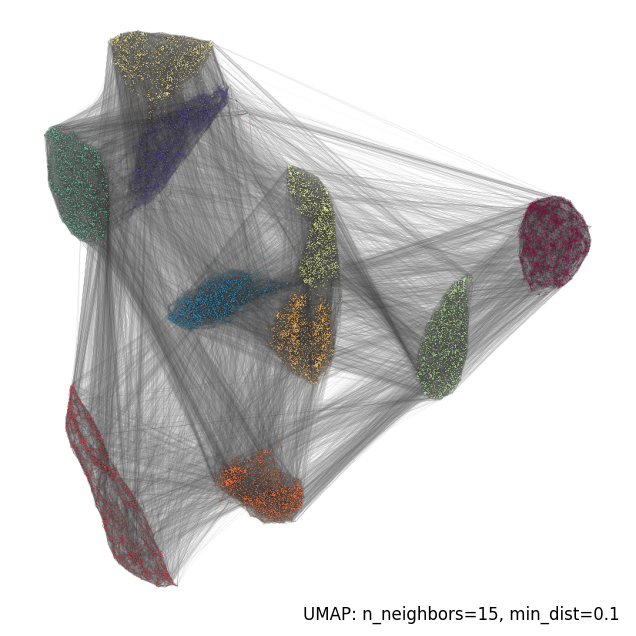

In [72]:
umap.plot.connectivity(mnist_umap, show_points=True,labels=mnist_label)

<Axes: title={'center': 'Colored by RGB coords of PCA embedding'}>

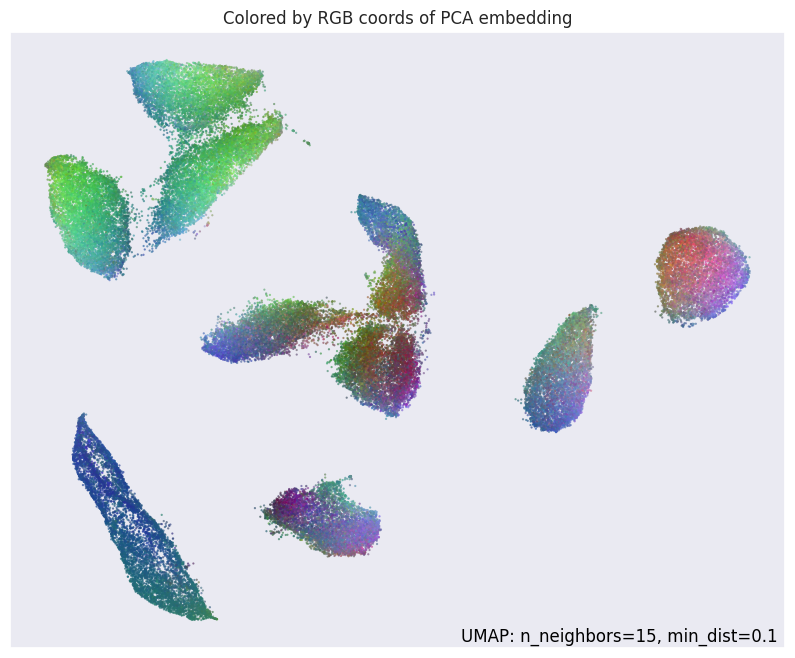

In [73]:
umap.plot.diagnostic(mnist_umap, diagnostic_type='pca')

##MISLEADING SETS

Text(0.5, 1.0, 'Original data')

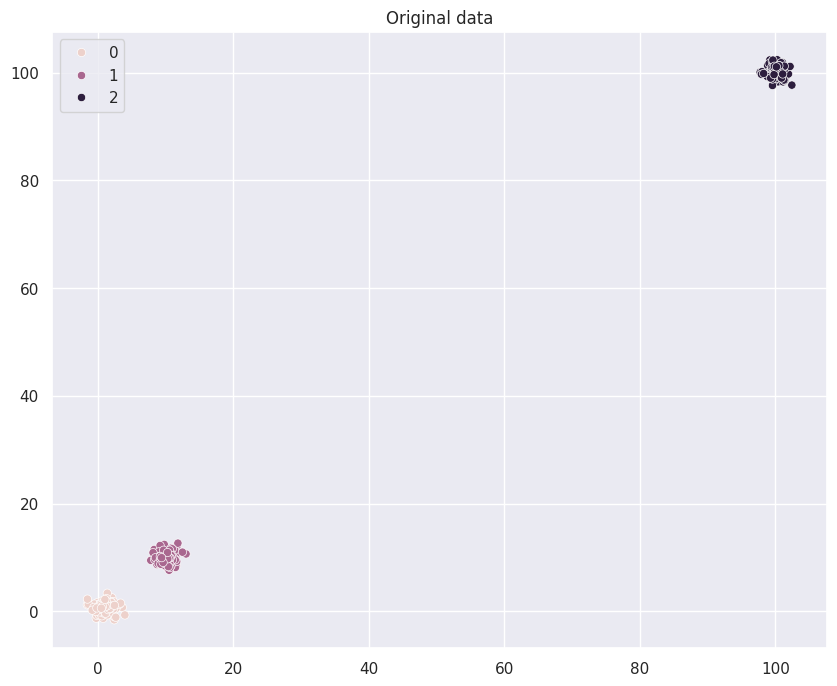

In [74]:
# Generate the dataset
blob_centers = [[1,1,1],[10,10,10], [100,100,100]]
blob_data, blob_ids = sklearn.datasets.make_blobs(
    n_samples=300,
    n_features=3,
    centers=blob_centers
)

sns.set_theme()
sns.scatterplot(x=blob_data[:,0], y=blob_data[:,1], hue=blob_ids)
plt.title('Original data')


<Axes: >

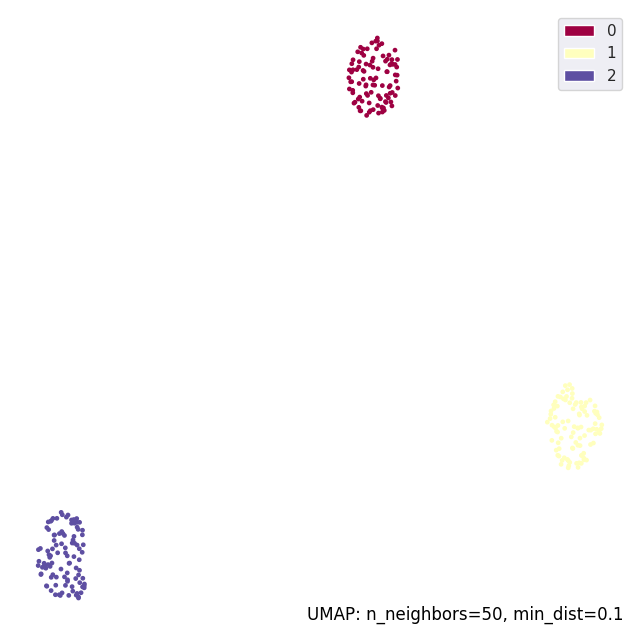

In [75]:
umap_obj_blobs = umap.UMAP(n_neighbors=50)
embedding_blobs = umap_obj_blobs.fit_transform(blob_data)

# Plot with visible densities and labels
uplot.points(umap_obj_blobs, labels=blob_ids)

<Axes: >

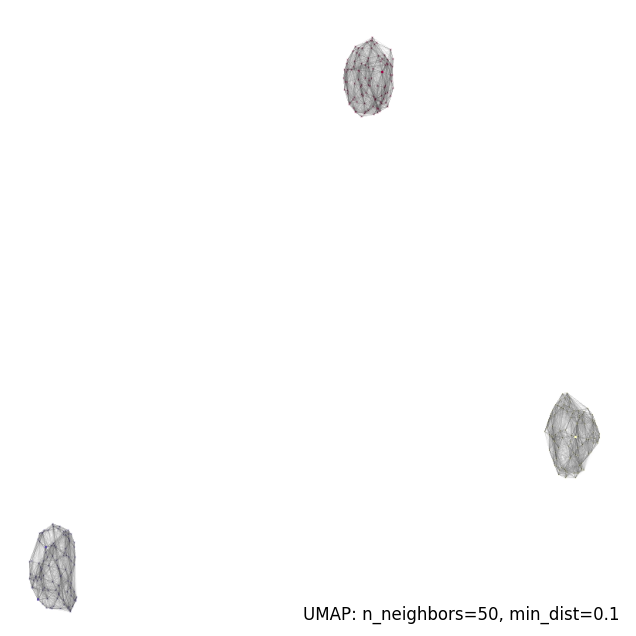

In [76]:
umap.plot.connectivity(umap_obj_blobs, show_points=True, labels=blob_ids)

<Axes: title={'center': 'Colored by RGB coords of PCA embedding'}>

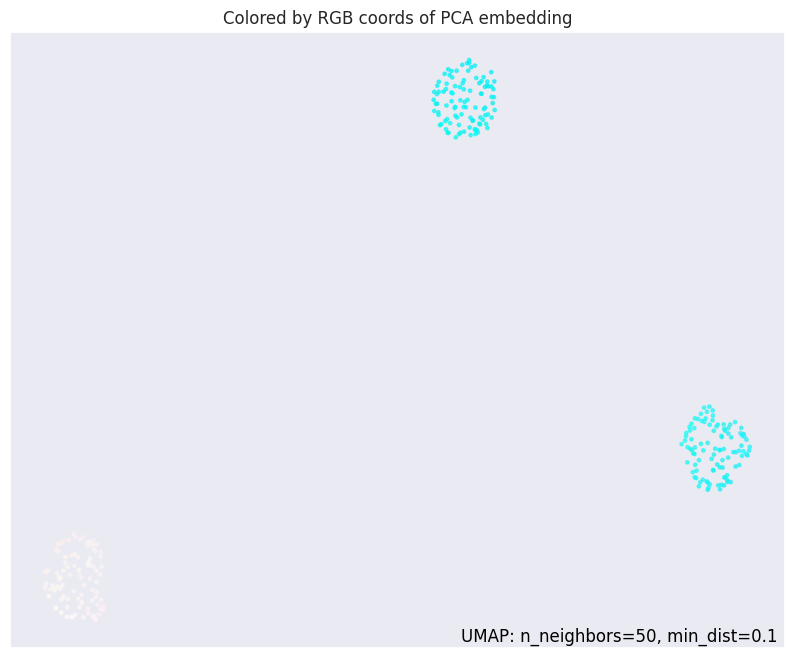

In [77]:
umap.plot.diagnostic(umap_obj_blobs, diagnostic_type='pca')

##SIZE CLUSTER MISLEADING

Text(0.5, 1.0, 'Original data')

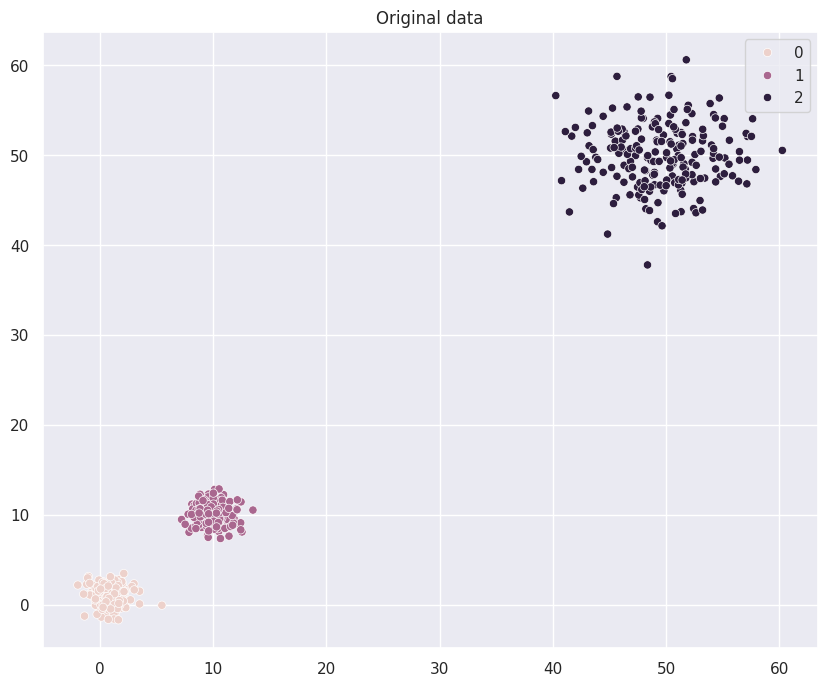

In [78]:
# Generate the dataset
blob_centers = [[1,1],[10,10], [50,50]]
blob_data, blob_ids = sklearn.datasets.make_blobs(
    n_samples=600,
    n_features=2,
    centers=blob_centers,
    cluster_std = [1,1,4]
)

sns.scatterplot(x=blob_data[:,0], y=blob_data[:,1], hue=blob_ids)
plt.title('Original data')

<Axes: >

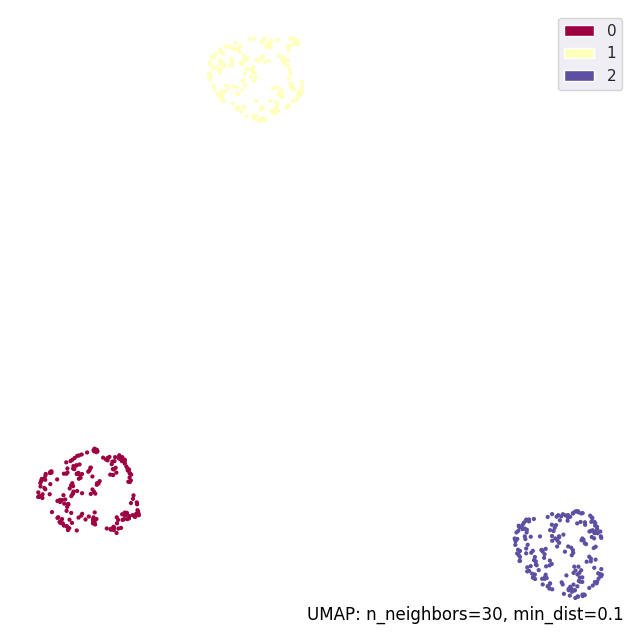

In [79]:
umap_obj_blobs = umap.UMAP(n_neighbors=30)
embedding_blobs = umap_obj_blobs.fit_transform(blob_data)

uplot.points(umap_obj_blobs, labels=blob_ids)

In [80]:
# Generate the dataset
blob_centers = [[1,1]]
blob_data, blob_ids = sklearn.datasets.make_blobs(
    n_samples=600,
    n_features=2,
    centers=blob_centers,
    cluster_std = [10]
)

Text(0.5, 1.0, 'Original data')

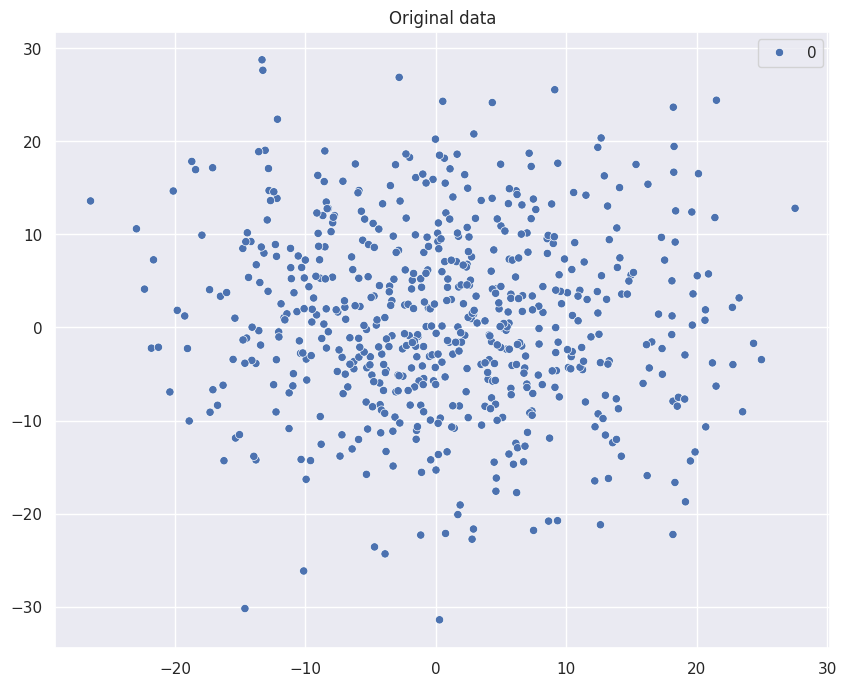

In [81]:
sns.set_theme()
sns.scatterplot(x=blob_data[:,0], y=blob_data[:,1], hue=blob_ids)
plt.title('Original data')

<Axes: >

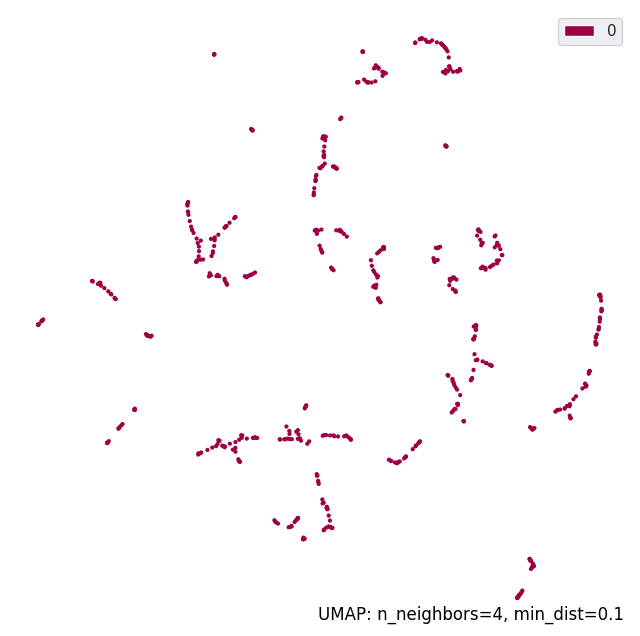

In [82]:
umap_obj_blobs = umap.UMAP(n_neighbors=4)
embedding_blobs = umap_obj_blobs.fit_transform(blob_data)

uplot.points(umap_obj_blobs, labels=blob_ids)